<a href="https://colab.research.google.com/github/Pepcoders/Data-Science-March/blob/main/YOLO_V5/yolo_v5_mar.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo

Cloning into 'yolov5'...
remote: Enumerating objects: 12385, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 12385 (delta 0), reused 3 (delta 0), pack-reused 12380
Receiving objects: 100% (12385/12385), 12.17 MiB | 12.37 MiB/s, done.
Resolving deltas: 100% (8543/8543), done.


In [2]:
%cd yolov5

/content/yolov5


In [3]:
%pip install -qr requirements.txt # install dependencies

     |████████████████████████████████| 596 kB 34.9 MB/s 


In [4]:
%pip install -q roboflow

     |████████████████████████████████| 145 kB 44.9 MB/s 
     |████████████████████████████████| 178 kB 68.6 MB/s 
     |████████████████████████████████| 3.1 MB 43.5 MB/s 
     |████████████████████████████████| 1.1 MB 67.5 MB/s 
     |████████████████████████████████| 21.8 MB 1.5 MB/s 
     |████████████████████████████████| 67 kB 5.8 MB/s 
     |████████████████████████████████| 54 kB 2.4 MB/s 
     |████████████████████████████████| 138 kB 76.6 MB/s 
     |████████████████████████████████| 62 kB 1.2 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.28.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
roboflow 0.2.7 re

In [5]:
import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.11.0+cu113 (Tesla T4)


!pip install roboflow

from roboflow import Roboflow

rf = Roboflow(api_key="PHQiuoCnfC16zGT3kkE5")

project = rf.workspace("augmented-startups").project("weeds-nxe1w")

dataset = project.version(3).download("yolov5")

In [13]:
pwd

'/content/yolov5'

In [14]:
from roboflow import Roboflow

rf = Roboflow(api_key="PHQiuoCnfC16zGT3kkE5")

project = rf.workspace("augmented-startups").project("weeds-nxe1w")

dataset = project.version(3).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Weeds-3 in yolov5pytorch:: 100%|██████████| 8418/8418 [00:08<00:00, 990.64it/s] 


In [15]:
dataset.location

'/content/yolov5/Weeds-3'

In [16]:
cd /content/yolov5

/content/yolov5


In [18]:
!python train.py --img 416 --batch 8 --epochs 20 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/yolov5/Weeds-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=20, batch_size=8, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-276-gc768919 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7,

In [19]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [20]:
!python detect.py --weights runs/train/exp4/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp4/weights/best.pt'], source=/content/yolov5/Weeds-3/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-276-gc768919 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/180 /content/yolov5/Weeds-3/test/images/20210907_153931_x264_mp4-1001_jpg.rf.10e747b443d1cd1f28967b51504cc446.jpg: 416x416 3 Weedss, Done. (0.009s)
image 2/180 /content/yolov5/Weeds-3/test/images/20210907_153931_x264_mp4-1007_jpg.rf.c11266cd6af9ec693efd1e98ae6005c2.jpg: 416x416 2 Weedss, Done. (0.010s)
image 3/180 /content/yolov5/Weed

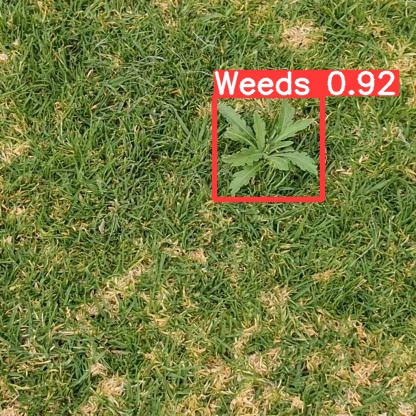

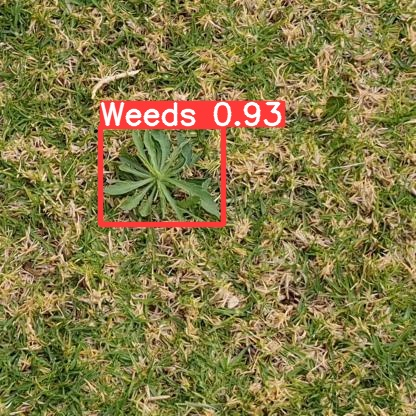

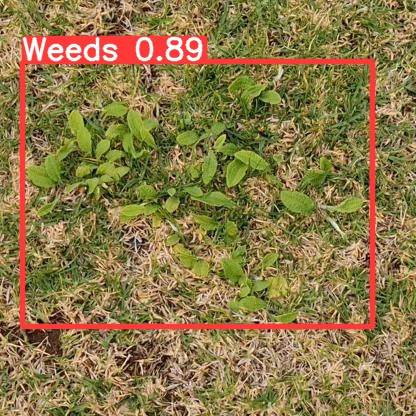

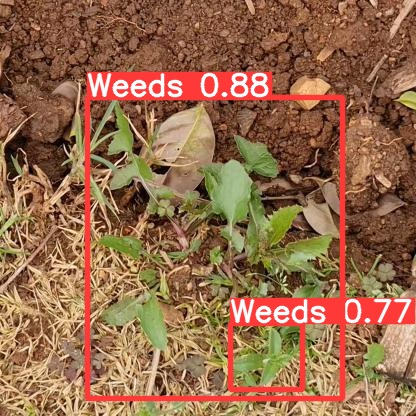

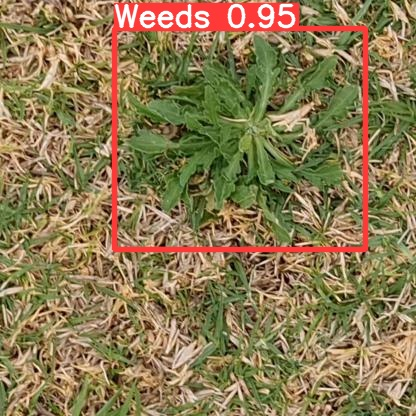

...

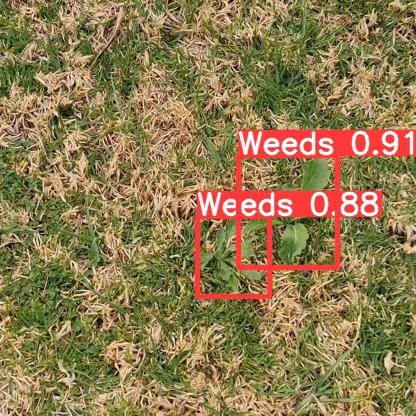

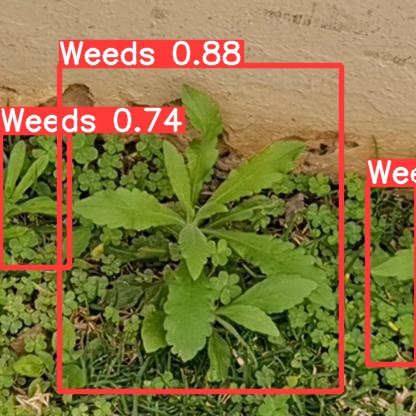

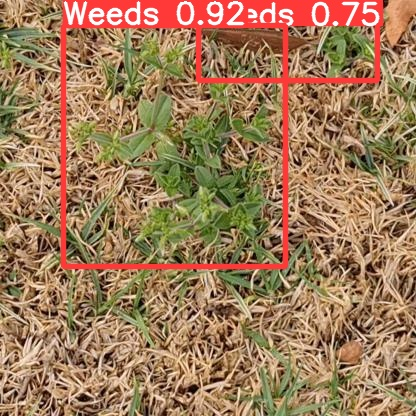

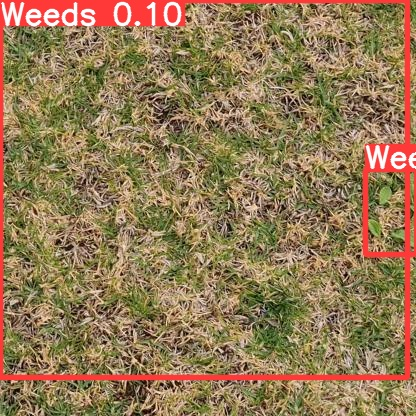

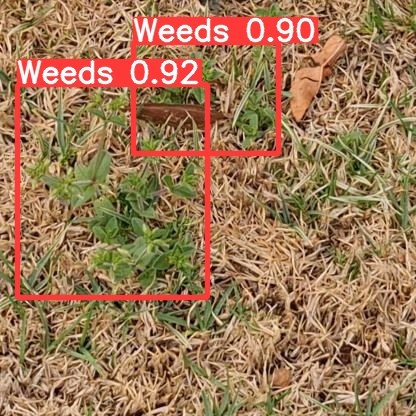

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")